# Mainfile project TDDE16
## Autoencoder approach

In [1]:
#### Imports ####
import torch
import torchvision
import pytorch_ssim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from autoencoder import CAE4, CAE3, CAEM, CAE0
from dataset_loader import load_dataset, load_data

import numpy as np
print(torch.__version__)

1.12.1+cu102


In [2]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# SEQ = True; Use frames in sequence (video-like), 10 frames at a time
# Gives the dimension [1, 10, 3, 124, 124]
# SEQ = False; Use images
# Gives the dimension [batchsize, 3, 124, 124]
SEQ = False

Selected device: cuda


### Load data

In [3]:
# The resolution of frames
image_dim = 124 # Not configurable at the moment.
C_in = 3 # Number of channels in the input image (3: RGB)
batch_size = 20 
seq_length = 10 # number of images in sequence

# Dataset 1
#anomaly_dir = './../data/desert/anomaly/'
#normal_dir = './../data/desert/normal/'
# Dataset 2
anomaly_dir = './../data/santa_clarita/anomaly/'
normal_dir = './../data/santa_clarita/normal/'


if not SEQ:
    # Loads images randomly (2D)
    train_loader, validation_loader, val_normal, val_anomaly, test_loader, test_normal, test_anomaly = load_dataset(anomaly_path=anomaly_dir,
                                                                                                    normal_path=normal_dir,
                                                                                                    image_dim=image_dim, 
                                                                                                    batch_size=batch_size)
else:
    # Loads images in sequence (3D)
    train_loader, validation_loader, test_loader = load_data(normal_dir, anomaly_dir, seq_length=seq_length)



Loaded 440 training images
Loaded 108 validation images
Loaded 112 test images


### Dataset analysis

torch.Size([20, 3, 124, 124])


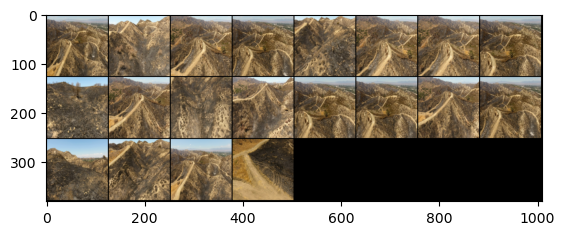

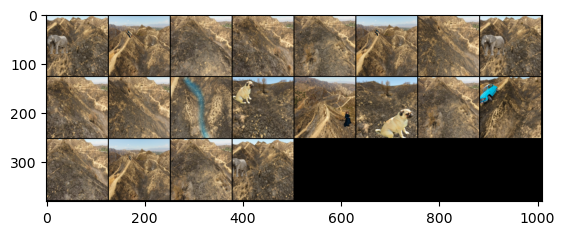

Batch size 20, channels 3, pixels 124x124
image values between 0.0 and 1.0


In [4]:
# Function that plots a batch of frames
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)
print(images.shape)

if(SEQ):
    # If (3d) remove dimension
    images = np.squeeze(images,axis=0)

# show some images
imshow(torchvision.utils.make_grid(images))

# get some random test images
dataiter = iter(test_loader)
images, labels = next(dataiter)

if(SEQ):
    # If (3d) remove dimension
    images = np.squeeze(images,axis=0)


# show some images
imshow(torchvision.utils.make_grid(images))
print(f"Batch size {images.shape[0]}, channels {images.shape[1]}, pixels {images.shape[2]}x{images.shape[3]}")
print(f"image values between {torch.min(images)} and {torch.max(images)}")

### Loss functions

In [5]:
# Structural Similarity Index
def SSIMLoss(y_true, y_pred):
  ssim_loss = pytorch_ssim.SSIM(window_size = 11)
  return 1 - ssim_loss(y_true,y_pred)

# Meansquare error times 1000 to get larger numbers.
def MSE1000(y_true, y_pred):
  mse = torch.nn.MSELoss()(y_true, y_pred)
  return mse*1000

criterion = MSE1000

# test using Simulation loss
#criterion = SSIMLoss

# test using normal MSE Loss function
#criterion = torch.nn.MSELoss()

# test using Binary Cross Entropy Loss function
#criterion = torch.nn.BCELoss()

### Model training

In [6]:
# Trains the given model for 1 epoch and returns the average error over all batches
def train_epoch(model,dataloader,optimizer,loss_fn):
    # Set train mode for both the model
    model.train()
    train_loss = []
    train_loss = 0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # load it to the active device
        image_batch = image_batch.to(device)
        
        images = np.squeeze(image_batch,axis=0) if SEQ else image_batch

        # ============ Forward ============
        # reset the gradients back to zero
        # PyTorch accumulates gradients on subsequent backward passes
        optimizer.zero_grad()
        
        # compute reconstructions
        reconstruct = model(images)
        
        # compute training reconstruction loss        
        loss = loss_fn(reconstruct, images)
        
        # ============ Backward ============
        # compute accumulated gradients
        loss.backward()
        
        # perform parameter update based on current gradients
        optimizer.step()
        
        # ============ Logging ============   
        # add the mini-batch training loss to epoch loss
        #train_loss.append()
        train_loss += loss.detach().cpu().item()
    return train_loss/len(dataloader)

### Model testing

In [7]:
def test_model(model, device, data_loader, loss_fn):
    # Set evaluation mode for model
    model.eval()
    #test_loss = []
    test_loss = 0
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        for batch_features, _ in data_loader:
            # Move tensor to the proper device
            batch_features = batch_features.to(device)
            images = np.squeeze(batch_features,axis=0) if SEQ else batch_features
            # Encode and decode data
            reconstruct = model(images)
            loss = loss_fn(reconstruct, images)
            #test_loss.append(loss.detach().cpu().numpy())
            test_loss += loss.detach().cpu()
        return test_loss/len(data_loader)

### Model hyperparameters

In [8]:
latent_dim = 225 # Dimension of the latent space
lr = 0.01 # Learning Rate
amp = 5 # Amplify the first output channels by amp (rest is multiplied by 2)   

### Model initialization

In [9]:
# 4 different models 
print(f"Model Parameters input_channels:{C_in}, Amplify:{amp}, Latent dimension:{latent_dim}")
#model = CAE4(C_in, amp, latent_dim).to(device)
#model = CAE3(C_in, amp, latent_dim).to(device)
model = CAEM(C_in, amp, latent_dim).to(device)
#model = CAE0(C_in, amp, latent_dim).to(device)
print(model)

Model Parameters input_channels:3, Amplify:5, Latent dimension:225
CAEM(
  (encoder): Sequential(
    (0): Conv2d(3, 15, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (2): ReLU(inplace=True)
    (3): Conv2d(15, 30, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): ReLU(inplace=True)
    (6): Conv2d(30, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): ReLU(inplace=True)
  )
  (latent_space): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=13500, out_features=225, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=225, out_features=13500, bias=True)
    (1): Unflatten(dim=1, unflattened_size=(60, 15, 15))
    (2): ConvTranspose2d(60, 30, kernel_size=(3, 3),

In [10]:
# Using an Adam Optimizer with lr = 0.1
print(f"Learning rate {lr}")
optimizer = torch.optim.Adam(model.parameters(), lr = lr)

Learning rate 0.01


In [11]:
# Plot a batch of images and reconstructions
def plot_ae_outputs(model, images):
  model.eval()
  reconstruction = model(images)
  
  plt.figure(figsize=[20, 20])
  plt.title("Original")
  plt.axis("off")
  imshow(torchvision.utils.make_grid(images.cpu(), nrow=batch_size))
  
  plt.figure(figsize=[20, 20])
  plt.title("Reconstruction")
  plt.axis("off")
  imshow(torchvision.utils.make_grid(reconstruction.cpu(), nrow=batch_size))

### Run training

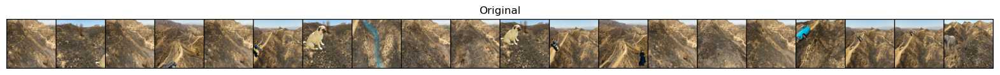

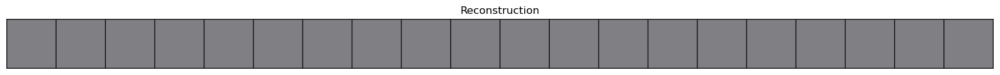


 | EPOCH 1/200 |	| train loss 33.863927667791195 |	| validation loss 33.44832229614258|

 | EPOCH 2/200 |	| train loss 21.14398800243031 |	| validation loss 21.446298599243164|

 | EPOCH 3/200 |	| train loss 18.941744457591664 |	| validation loss 19.34416389465332|

 | EPOCH 4/200 |	| train loss 18.41431929848411 |	| validation loss 18.927244186401367|

 | EPOCH 5/200 |	| train loss 18.1682409806685 |	| validation loss 18.789215087890625|

 | EPOCH 6/200 |	| train loss 17.61521087993275 |	| validation loss 18.852052688598633|

 | EPOCH 7/200 |	| train loss 16.45723685351285 |	| validation loss 18.469223022460938|

 | EPOCH 8/200 |	| train loss 15.65821175141768 |	| validation loss 17.40774917602539|

 | EPOCH 9/200 |	| train loss 14.862492301247336 |	| validation loss 17.075918197631836|

 | EPOCH 10/200 |	| train loss 13.908198833465576 |	| validation loss 16.911161422729492|


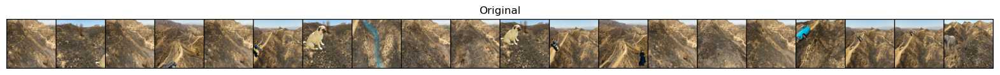

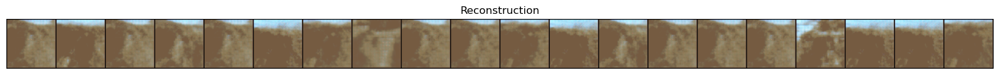


 | EPOCH 11/200 |	| train loss 12.980199337005615 |	| validation loss 16.77793312072754|

 | EPOCH 12/200 |	| train loss 12.219358227469705 |	| validation loss 16.850976943969727|

 | EPOCH 13/200 |	| train loss 11.600994673642246 |	| validation loss 16.589563369750977|

 | EPOCH 14/200 |	| train loss 10.958060177889736 |	| validation loss 17.062631607055664|

 | EPOCH 15/200 |	| train loss 10.521878415888006 |	| validation loss 17.743270874023438|

 | EPOCH 16/200 |	| train loss 10.0275822986256 |	| validation loss 17.266071319580078|

 | EPOCH 17/200 |	| train loss 9.648581158031117 |	| validation loss 17.608617782592773|

 | EPOCH 18/200 |	| train loss 9.256597692316229 |	| validation loss 18.03517723083496|

 | EPOCH 19/200 |	| train loss 8.944858074188232 |	| validation loss 17.6481876373291|

 | EPOCH 20/200 |	| train loss 8.776520252227783 |	| validation loss 17.876863479614258|


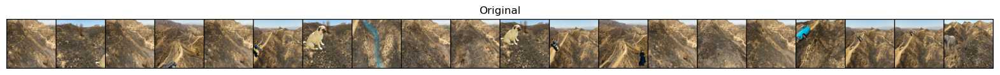

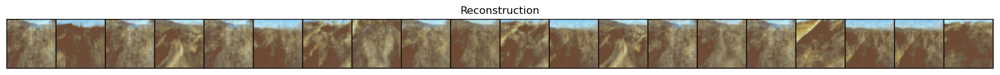


 | EPOCH 21/200 |	| train loss 8.673545967448842 |	| validation loss 18.24945831298828|

 | EPOCH 22/200 |	| train loss 8.397918657823043 |	| validation loss 17.2644100189209|

 | EPOCH 23/200 |	| train loss 7.770314823497426 |	| validation loss 16.660221099853516|

 | EPOCH 24/200 |	| train loss 6.100344983014193 |	| validation loss 16.370351791381836|

 | EPOCH 25/200 |	| train loss 5.8505471619692715 |	| validation loss 17.274606704711914|

 | EPOCH 26/200 |	| train loss 5.683811122720892 |	| validation loss 18.107295989990234|

 | EPOCH 27/200 |	| train loss 5.510009570555254 |	| validation loss 16.132709503173828|

 | EPOCH 28/200 |	| train loss 5.208332170139659 |	| validation loss 16.363147735595703|

 | EPOCH 29/200 |	| train loss 5.07145788452842 |	| validation loss 16.43070411682129|

 | EPOCH 30/200 |	| train loss 4.925807150927457 |	| validation loss 17.02210807800293|


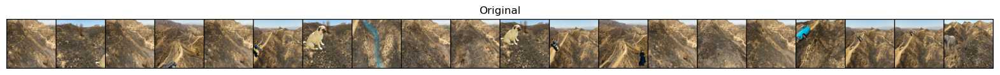

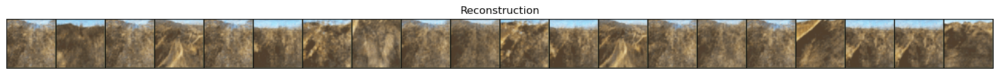


 | EPOCH 31/200 |	| train loss 4.924339922991666 |	| validation loss 17.8282413482666|

 | EPOCH 32/200 |	| train loss 4.758625789122148 |	| validation loss 17.243013381958008|

 | EPOCH 33/200 |	| train loss 4.740045634183017 |	| validation loss 16.899988174438477|

 | EPOCH 34/200 |	| train loss 4.647912393916737 |	| validation loss 16.371004104614258|

 | EPOCH 35/200 |	| train loss 4.505394480445168 |	| validation loss 16.890865325927734|

 | EPOCH 36/200 |	| train loss 4.4739318977702744 |	| validation loss 17.419950485229492|

 | EPOCH 37/200 |	| train loss 4.4630209099162705 |	| validation loss 17.44403648376465|

 | EPOCH 38/200 |	| train loss 4.376432982358065 |	| validation loss 17.040117263793945|

 | EPOCH 39/200 |	| train loss 4.296909928321838 |	| validation loss 16.834850311279297|

 | EPOCH 40/200 |	| train loss 4.353320056741888 |	| validation loss 16.500375747680664|


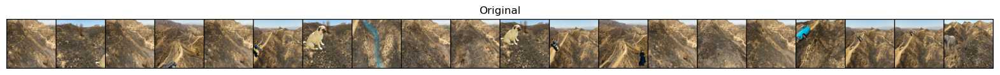

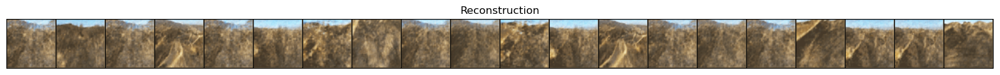


 | EPOCH 41/200 |	| train loss 4.2275448712435635 |	| validation loss 16.243282318115234|

 | EPOCH 42/200 |	| train loss 4.173070214011452 |	| validation loss 17.64712905883789|

 | EPOCH 43/200 |	| train loss 4.155350002375516 |	| validation loss 16.120817184448242|

 | EPOCH 44/200 |	| train loss 4.11402567950162 |	| validation loss 18.193723678588867|

 | EPOCH 45/200 |	| train loss 4.055884328755465 |	| validation loss 17.127717971801758|

 | EPOCH 46/200 |	| train loss 4.067835580218922 |	| validation loss 16.09714698791504|

 | EPOCH 47/200 |	| train loss 3.989634156227112 |	| validation loss 17.9050350189209|

 | EPOCH 48/200 |	| train loss 3.9308275309475986 |	| validation loss 17.61227798461914|

 | EPOCH 49/200 |	| train loss 3.9411478367718784 |	| validation loss 16.946578979492188|

 | EPOCH 50/200 |	| train loss 3.8574532595547764 |	| validation loss 17.622621536254883|


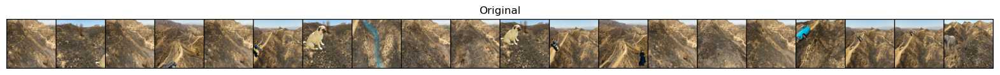

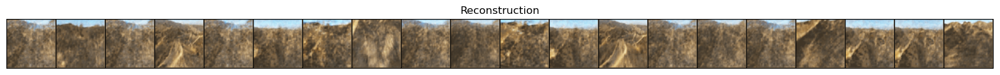


 | EPOCH 51/200 |	| train loss 3.832278446717696 |	| validation loss 16.78440284729004|

 | EPOCH 52/200 |	| train loss 3.825994675809687 |	| validation loss 17.55963134765625|

 | EPOCH 53/200 |	| train loss 3.7986626625061035 |	| validation loss 16.618865966796875|

 | EPOCH 54/200 |	| train loss 3.764761111953042 |	| validation loss 16.622900009155273|

 | EPOCH 55/200 |	| train loss 3.7618546919389204 |	| validation loss 17.480253219604492|

 | EPOCH 56/200 |	| train loss 3.7745068723505195 |	| validation loss 17.661191940307617|

 | EPOCH 57/200 |	| train loss 3.7704237049276177 |	| validation loss 16.42303466796875|

 | EPOCH 58/200 |	| train loss 3.691886143250899 |	| validation loss 17.238252639770508|

 | EPOCH 59/200 |	| train loss 3.6994642452760176 |	| validation loss 15.970839500427246|

 | EPOCH 60/200 |	| train loss 3.6601807962764394 |	| validation loss 16.96587371826172|


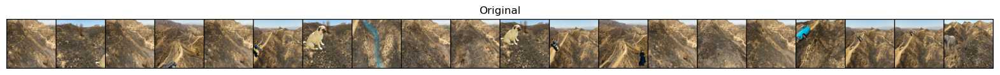

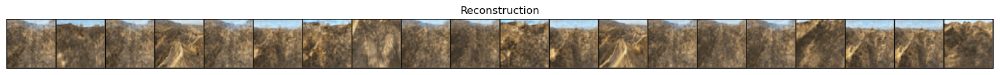


 | EPOCH 61/200 |	| train loss 3.5857788757844404 |	| validation loss 16.095373153686523|

 | EPOCH 62/200 |	| train loss 3.594378428025679 |	| validation loss 16.703445434570312|

 | EPOCH 63/200 |	| train loss 3.539636503566395 |	| validation loss 16.344341278076172|

 | EPOCH 64/200 |	| train loss 3.5518694032322276 |	| validation loss 16.285541534423828|

 | EPOCH 65/200 |	| train loss 3.511409651149403 |	| validation loss 17.188425064086914|

 | EPOCH 66/200 |	| train loss 3.4373476071791216 |	| validation loss 17.86210823059082|

 | EPOCH 67/200 |	| train loss 3.4227777286009355 |	| validation loss 16.717592239379883|

 | EPOCH 68/200 |	| train loss 3.4102618369189175 |	| validation loss 17.00554084777832|

 | EPOCH 69/200 |	| train loss 3.4589284550059927 |	| validation loss 16.815961837768555|

 | EPOCH 70/200 |	| train loss 3.4056500629945234 |	| validation loss 15.481305122375488|


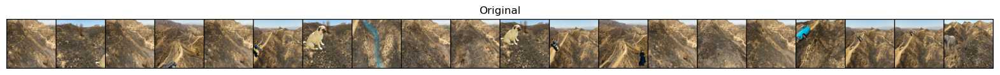

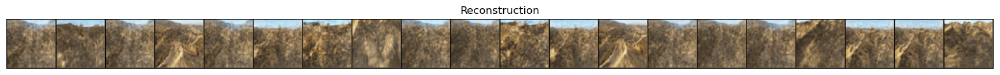


 | EPOCH 71/200 |	| train loss 3.3942206556146797 |	| validation loss 17.310468673706055|

 | EPOCH 72/200 |	| train loss 3.4829571788961236 |	| validation loss 17.12135887145996|

 | EPOCH 73/200 |	| train loss 3.42954928224737 |	| validation loss 17.602991104125977|

 | EPOCH 74/200 |	| train loss 3.4091210690411655 |	| validation loss 17.39106559753418|

 | EPOCH 75/200 |	| train loss 3.3581455837596548 |	| validation loss 15.17381763458252|

 | EPOCH 76/200 |	| train loss 3.3157667138359765 |	| validation loss 16.379302978515625|

 | EPOCH 77/200 |	| train loss 3.2509310895746406 |	| validation loss 16.321983337402344|

 | EPOCH 78/200 |	| train loss 3.1988099921833384 |	| validation loss 16.657529830932617|

 | EPOCH 79/200 |	| train loss 3.2764224030754785 |	| validation loss 16.693876266479492|

 | EPOCH 80/200 |	| train loss 3.265166076746854 |	| validation loss 16.8271541595459|


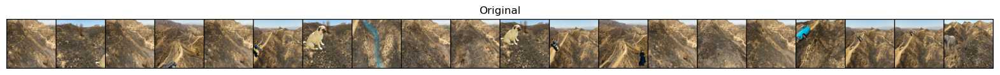

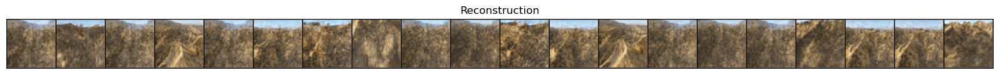


 | EPOCH 81/200 |	| train loss 3.2202228307724 |	| validation loss 16.234697341918945|

 | EPOCH 82/200 |	| train loss 3.173796198584817 |	| validation loss 16.709012985229492|

 | EPOCH 83/200 |	| train loss 3.2275576158003374 |	| validation loss 17.241289138793945|

 | EPOCH 84/200 |	| train loss 3.2311067797920923 |	| validation loss 15.949732780456543|

 | EPOCH 85/200 |	| train loss 3.215228861028498 |	| validation loss 16.87382698059082|

 | EPOCH 86/200 |	| train loss 3.1372921033339067 |	| validation loss 16.69127655029297|

 | EPOCH 87/200 |	| train loss 3.1532654653895986 |	| validation loss 16.51509666442871|

 | EPOCH 88/200 |	| train loss 3.092528549107638 |	| validation loss 17.294965744018555|

 | EPOCH 89/200 |	| train loss 3.0527317957444624 |	| validation loss 16.519397735595703|

 | EPOCH 90/200 |	| train loss 3.0592814033681694 |	| validation loss 16.21022605895996|


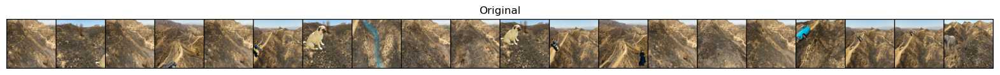

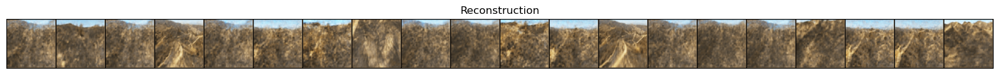


 | EPOCH 91/200 |	| train loss 3.0782912861217153 |	| validation loss 16.29726219177246|

 | EPOCH 92/200 |	| train loss 3.0286918445066973 |	| validation loss 16.015745162963867|

 | EPOCH 93/200 |	| train loss 3.038423689928922 |	| validation loss 15.992339134216309|

 | EPOCH 94/200 |	| train loss 3.0493009849028154 |	| validation loss 16.224084854125977|

 | EPOCH 95/200 |	| train loss 3.0133146155964243 |	| validation loss 16.593534469604492|

 | EPOCH 96/200 |	| train loss 3.0340976498343726 |	| validation loss 17.294677734375|

 | EPOCH 97/200 |	| train loss 2.9940177635713057 |	| validation loss 16.463342666625977|

 | EPOCH 98/200 |	| train loss 3.0060800205577505 |	| validation loss 16.22124481201172|

 | EPOCH 99/200 |	| train loss 2.9807465943423184 |	| validation loss 16.152162551879883|

 | EPOCH 100/200 |	| train loss 2.9300126054070215 |	| validation loss 17.077852249145508|


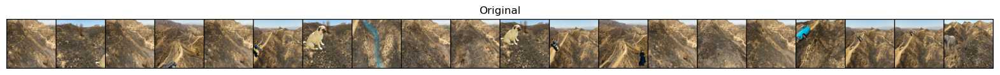

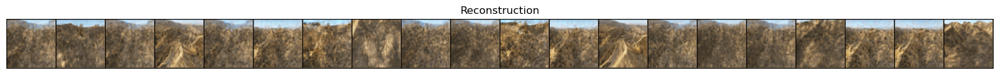


 | EPOCH 101/200 |	| train loss 2.927202268080278 |	| validation loss 16.31876564025879|

 | EPOCH 102/200 |	| train loss 2.95137299190868 |	| validation loss 16.707263946533203|

 | EPOCH 103/200 |	| train loss 2.976675022732128 |	| validation loss 16.609745025634766|

 | EPOCH 104/200 |	| train loss 2.988978483460166 |	| validation loss 18.07472038269043|

 | EPOCH 105/200 |	| train loss 2.929445906118913 |	| validation loss 16.38119125366211|

 | EPOCH 106/200 |	| train loss 2.898796970194036 |	| validation loss 15.64327335357666|

 | EPOCH 107/200 |	| train loss 2.8741566159508447 |	| validation loss 16.283124923706055|

 | EPOCH 108/200 |	| train loss 2.8523895198648628 |	| validation loss 16.11491584777832|

 | EPOCH 109/200 |	| train loss 2.8307287909767846 |	| validation loss 16.44942283630371|

 | EPOCH 110/200 |	| train loss 2.83431520245292 |	| validation loss 16.28425407409668|


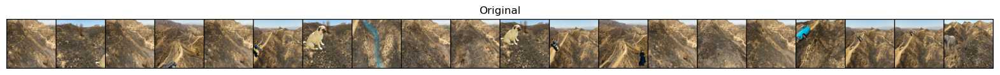

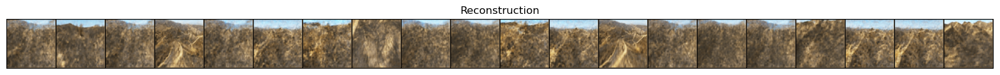


 | EPOCH 111/200 |	| train loss 2.803671522573991 |	| validation loss 15.469021797180176|

 | EPOCH 112/200 |	| train loss 2.811938914385709 |	| validation loss 16.338361740112305|

 | EPOCH 113/200 |	| train loss 2.817343375899575 |	| validation loss 16.531274795532227|

 | EPOCH 114/200 |	| train loss 2.861159335483204 |	| validation loss 16.063337326049805|

 | EPOCH 115/200 |	| train loss 2.831163027069785 |	| validation loss 17.490816116333008|

 | EPOCH 116/200 |	| train loss 2.917760643092069 |	| validation loss 15.70969295501709|

 | EPOCH 117/200 |	| train loss 2.8807824850082397 |	| validation loss 17.076143264770508|

 | EPOCH 118/200 |	| train loss 2.8093373450365933 |	| validation loss 16.833003997802734|

 | EPOCH 119/200 |	| train loss 2.7994179834019053 |	| validation loss 15.959748268127441|

 | EPOCH 120/200 |	| train loss 2.7533841783350166 |	| validation loss 16.50316047668457|


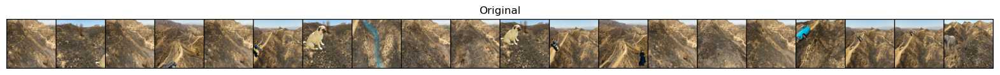

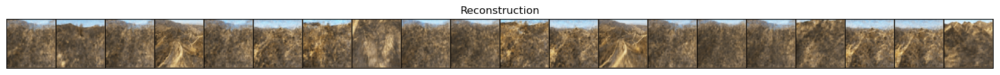


 | EPOCH 121/200 |	| train loss 2.7300503687425093 |	| validation loss 16.759878158569336|

 | EPOCH 122/200 |	| train loss 2.7636387023058804 |	| validation loss 15.447731018066406|

 | EPOCH 123/200 |	| train loss 2.752779245376587 |	| validation loss 16.40107536315918|

 | EPOCH 124/200 |	| train loss 2.7401683872396294 |	| validation loss 15.371665954589844|

 | EPOCH 125/200 |	| train loss 2.7050587480718438 |	| validation loss 16.207618713378906|

 | EPOCH 126/200 |	| train loss 2.7754394791342993 |	| validation loss 16.72161293029785|

 | EPOCH 127/200 |	| train loss 2.817678061398593 |	| validation loss 16.528696060180664|

 | EPOCH 128/200 |	| train loss 2.80052789774808 |	| validation loss 15.62836742401123|

 | EPOCH 129/200 |	| train loss 2.7141898653723975 |	| validation loss 16.40345001220703|

 | EPOCH 130/200 |	| train loss 2.696951085870916 |	| validation loss 16.02351188659668|


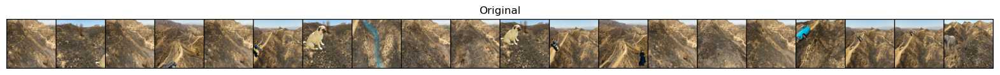

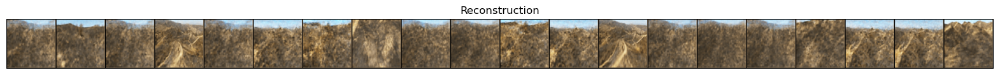


 | EPOCH 131/200 |	| train loss 2.7110271128741177 |	| validation loss 15.85039234161377|

 | EPOCH 132/200 |	| train loss 2.6463426026430996 |	| validation loss 16.472415924072266|

 | EPOCH 133/200 |	| train loss 2.680261644450101 |	| validation loss 15.688380241394043|

 | EPOCH 134/200 |	| train loss 2.692971695553173 |	| validation loss 16.25877571105957|

 | EPOCH 135/200 |	| train loss 2.6407427245920356 |	| validation loss 16.00023651123047|

 | EPOCH 136/200 |	| train loss 2.6630037264390425 |	| validation loss 17.444650650024414|

 | EPOCH 137/200 |	| train loss 2.6198121959512886 |	| validation loss 15.725369453430176|

 | EPOCH 138/200 |	| train loss 2.5877852006392046 |	| validation loss 16.573299407958984|

 | EPOCH 139/200 |	| train loss 2.5911511941389604 |	| validation loss 16.82349967956543|

 | EPOCH 140/200 |	| train loss 2.616793079809709 |	| validation loss 16.162965774536133|


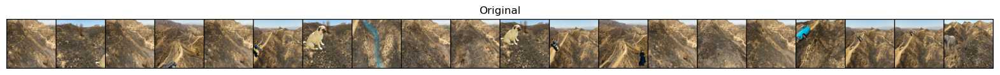

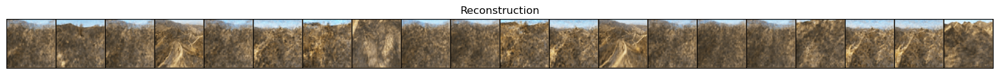


 | EPOCH 141/200 |	| train loss 2.5778008699417114 |	| validation loss 16.31094741821289|

 | EPOCH 142/200 |	| train loss 2.5680718530308115 |	| validation loss 15.83019733428955|

 | EPOCH 143/200 |	| train loss 2.546683419834484 |	| validation loss 16.265832901000977|

 | EPOCH 144/200 |	| train loss 2.528117537498474 |	| validation loss 16.64841079711914|

 | EPOCH 145/200 |	| train loss 2.5688681927594272 |	| validation loss 16.483644485473633|

 | EPOCH 146/200 |	| train loss 2.5732570344751533 |	| validation loss 16.35994529724121|

 | EPOCH 147/200 |	| train loss 2.536743467504328 |	| validation loss 16.718759536743164|

 | EPOCH 148/200 |	| train loss 2.5242791826074775 |	| validation loss 15.984649658203125|

 | EPOCH 149/200 |	| train loss 2.489977229725231 |	| validation loss 16.306137084960938|

 | EPOCH 150/200 |	| train loss 2.5298896486108955 |	| validation loss 16.297880172729492|


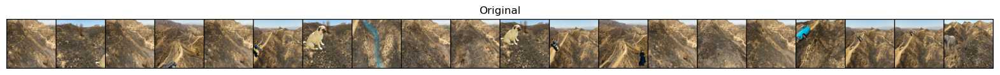

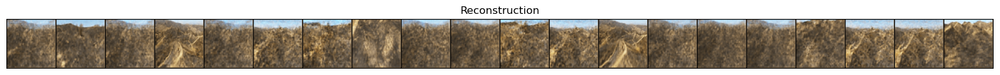


 | EPOCH 151/200 |	| train loss 2.489899451082403 |	| validation loss 16.01146697998047|

 | EPOCH 152/200 |	| train loss 2.4970173727382314 |	| validation loss 16.367013931274414|

 | EPOCH 153/200 |	| train loss 2.4736477461728184 |	| validation loss 16.155439376831055|

 | EPOCH 154/200 |	| train loss 2.489241740920327 |	| validation loss 17.075471878051758|

 | EPOCH 155/200 |	| train loss 2.5045973496003584 |	| validation loss 16.312475204467773|

 | EPOCH 156/200 |	| train loss 2.4537774216045034 |	| validation loss 15.943982124328613|

 | EPOCH 157/200 |	| train loss 2.438053597103466 |	| validation loss 15.544987678527832|

 | EPOCH 158/200 |	| train loss 2.4585999792272393 |	| validation loss 15.955765724182129|

 | EPOCH 159/200 |	| train loss 2.482402032071894 |	| validation loss 16.09495735168457|

 | EPOCH 160/200 |	| train loss 2.4804022420536387 |	| validation loss 16.483638763427734|


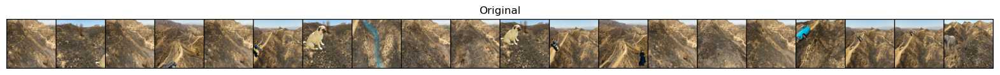

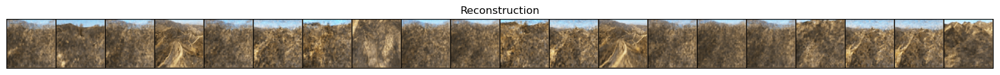


 | EPOCH 161/200 |	| train loss 2.4927713545885952 |	| validation loss 16.029848098754883|

 | EPOCH 162/200 |	| train loss 2.4703637686642734 |	| validation loss 15.306464195251465|

 | EPOCH 163/200 |	| train loss 2.466021787036549 |	| validation loss 17.29599952697754|

 | EPOCH 164/200 |	| train loss 2.427686322819103 |	| validation loss 16.6070556640625|

 | EPOCH 165/200 |	| train loss 2.4015658551996406 |	| validation loss 16.195541381835938|

 | EPOCH 166/200 |	| train loss 2.4145422957160254 |	| validation loss 15.463554382324219|

 | EPOCH 167/200 |	| train loss 2.397928552194075 |	| validation loss 15.582026481628418|

 | EPOCH 168/200 |	| train loss 2.395101623101668 |	| validation loss 15.36894702911377|

 | EPOCH 169/200 |	| train loss 2.387921235778115 |	| validation loss 16.024736404418945|

 | EPOCH 170/200 |	| train loss 2.4341483332894067 |	| validation loss 15.345760345458984|


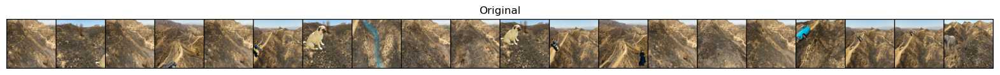

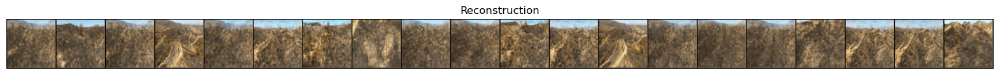


 | EPOCH 171/200 |	| train loss 2.4089912826364692 |	| validation loss 15.843406677246094|

 | EPOCH 172/200 |	| train loss 2.4254300485957754 |	| validation loss 16.177465438842773|

 | EPOCH 173/200 |	| train loss 2.3954735669222744 |	| validation loss 16.04132843017578|

 | EPOCH 174/200 |	| train loss 2.3543386567722666 |	| validation loss 16.27802085876465|

 | EPOCH 175/200 |	| train loss 2.348497889258645 |	| validation loss 16.24464988708496|

 | EPOCH 176/200 |	| train loss 2.3219882358204234 |	| validation loss 16.685237884521484|

 | EPOCH 177/200 |	| train loss 2.3391481096094306 |	| validation loss 15.707737922668457|

 | EPOCH 178/200 |	| train loss 2.3240263245322486 |	| validation loss 15.990187644958496|

 | EPOCH 179/200 |	| train loss 2.329561016776345 |	| validation loss 16.052751541137695|

 | EPOCH 180/200 |	| train loss 2.3053008534691553 |	| validation loss 16.312726974487305|


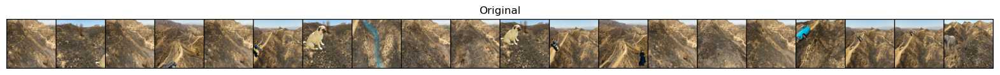

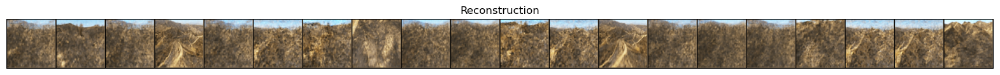


 | EPOCH 181/200 |	| train loss 2.343568368391557 |	| validation loss 15.861980438232422|

 | EPOCH 182/200 |	| train loss 2.3252405036579478 |	| validation loss 16.723249435424805|

 | EPOCH 183/200 |	| train loss 2.345158349383961 |	| validation loss 16.459402084350586|

 | EPOCH 184/200 |	| train loss 2.326586203141646 |	| validation loss 16.16786003112793|

 | EPOCH 185/200 |	| train loss 2.319242845882069 |	| validation loss 16.566993713378906|

 | EPOCH 186/200 |	| train loss 2.2735595161264595 |	| validation loss 15.059219360351562|

 | EPOCH 187/200 |	| train loss 2.207380858334628 |	| validation loss 15.252169609069824|

 | EPOCH 188/200 |	| train loss 2.2586422616785224 |	| validation loss 15.600208282470703|

 | EPOCH 189/200 |	| train loss 2.2805422869595615 |	| validation loss 16.44074058532715|

 | EPOCH 190/200 |	| train loss 2.2333029291846533 |	| validation loss 16.148035049438477|


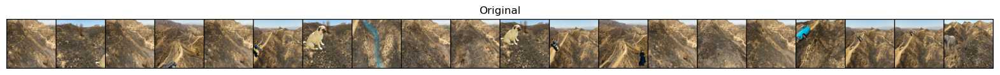

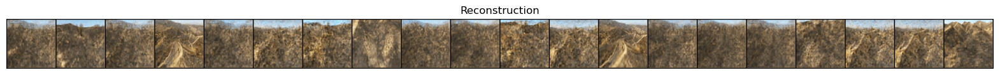


 | EPOCH 191/200 |	| train loss 2.244000705805692 |	| validation loss 16.066308975219727|

 | EPOCH 192/200 |	| train loss 2.234273000196977 |	| validation loss 16.38454246520996|

 | EPOCH 193/200 |	| train loss 2.273667422207919 |	| validation loss 16.424619674682617|

 | EPOCH 194/200 |	| train loss 2.2569857185537163 |	| validation loss 16.26246452331543|

 | EPOCH 195/200 |	| train loss 2.2315438227220015 |	| validation loss 16.507001876831055|

 | EPOCH 196/200 |	| train loss 2.215959982438521 |	| validation loss 14.950358390808105|

 | EPOCH 197/200 |	| train loss 2.197754827412692 |	| validation loss 16.536052703857422|

 | EPOCH 198/200 |	| train loss 2.208128208463842 |	| validation loss 16.923324584960938|

 | EPOCH 199/200 |	| train loss 2.1959042874249546 |	| validation loss 15.316047668457031|

 | EPOCH 200/200 |	| train loss 2.255896199833263 |	| validation loss 15.881690979003906|


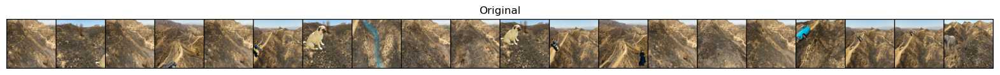

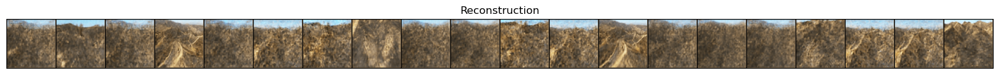

In [12]:
# Training parameters
num_epochs = 200 # Number of epochs to train the model with
losses = {'train_loss':[],'val_loss':[]}

# Pick one batch to visualize
with torch.no_grad():
    for batch_features in test_loader:
        batch_features = batch_features[0].to(device)
        images = np.squeeze(batch_features,axis=0) if SEQ else batch_features
        plot_ae_outputs(model,images)
        break

# Train model, calculate loss and visualize
for epoch in range(num_epochs):
   train_loss = train_epoch(model, train_loader, optimizer, criterion)
   val_loss = test_model(model, device, validation_loader, criterion)
   print('\n | EPOCH {}/{} |\t| train loss {} |\t| validation loss {}|'.format(epoch + 1, num_epochs,train_loss, val_loss))
   losses['train_loss'].append(train_loss)
   losses['val_loss'].append(val_loss)
   if (epoch+1)%10 == 0:   
    plot_ae_outputs(model,images)

In [13]:
# Plot train and test loss in a plot 
def plot_losses(losses):
    plt.figure(figsize=(10,8))
    plt.semilogy(losses['train_loss'], label='Train')
    plt.semilogy(losses['val_loss'], label='Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Average Loss')
    plt.grid()
    plt.legend()
    plt.title('Train and Validation losses')
    plt.show()

### Losses

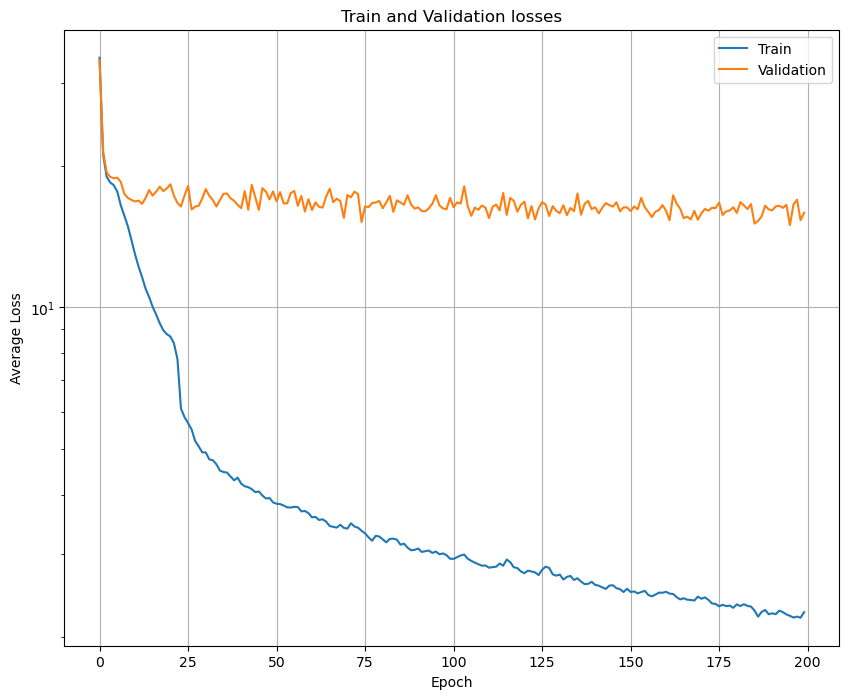

In [14]:
plot_losses(losses)

## Calculate the final validation error

In [15]:
# Final evaluation
final_validation_error = test_model(model, device, validation_loader, criterion).item()
print(f"## VALIDATION ERROR IN LAST EPOCH: {final_validation_error} ##")

## VALIDATION ERROR IN LAST EPOCH: 16.541200637817383 ##


In [16]:
# Plot a batch of normal and reconstructed images side by side
def plot_compare(batch_features, reconstruction):
    imgs = torch.stack([batch_features.cpu(), reconstruction.cpu()], dim=1).flatten(0, 1)
    grid = torchvision.utils.make_grid(imgs, nrow=4, normalize=False, value_range=(-1, 1))
    grid = grid.permute(1, 2, 0)
    plt.figure(figsize=(5, 2))
    plt.title("Reconstructed from latents")
    plt.imshow(grid)
    plt.axis("off")
    plt.show()

### Predict if a reconstruction is a anomaly or normal (images)

In [17]:
# Binary classification with the trained autoencoder model
# 0 means anomaly
# 1 means
def predict2D(model, threshold, normals, loss_fn, anomalies, show=False):
    normal_loader = DataLoader(normals, batch_size=1, shuffle=False, num_workers=2)
    anomaly_loader = DataLoader(anomalies, batch_size=1, shuffle=False, num_workers=2)
    n_anomalies = len(anomaly_loader)
    n_normals = len(normal_loader)
    y_pred = []
    nr_of_images = 0
    with torch.no_grad():
        model.eval()
        for batch_features in anomaly_loader:
            batch_features = batch_features[0].to(device)
            reconstruction = model(batch_features)
            b = loss_fn(batch_features, reconstruction).item()
            if b > threshold:
                y_pred.append(0)
            else:
                y_pred.append(1)
                if nr_of_images < 5 and show:
                    print(f"Classified as normal but is anomaly, error: {b}")
                    plot_compare(batch_features,reconstruction)
                    nr_of_images+=1
        for batch_features in normal_loader:
            batch_features = batch_features[0].to(device)
            reconstruction = model(batch_features)
            b = loss_fn(batch_features, reconstruction).item()
            if b > threshold:
                y_pred.append(0)
                if nr_of_images < 10 and show:
                    print(f"Classified as Anomaly but is normal, error: {b}")
                    plot_compare(batch_features,reconstruction)
                    nr_of_images+=1
            else:
                y_pred.append(1)
    return y_pred

### Predict if a video is an anomaly or normal

In [18]:
# Binary classification with the trained autoencoder model
# 0 means anomaly
# 1 means normal
def predictSEQ(model, y_true, threshold, loader, loss_fn, show=False):
    y_pred = []
    i = 0
    nr_of_images = 0
    with torch.no_grad():
        model.eval()
        for batch_features in loader:
            images = batch_features[0].to(device)
            images = np.squeeze(images,axis=0)
            reconstruction = model(images)
            b = loss_fn(images, reconstruction).item()
            if b > threshold:
                pred = 0
            else:
                pred = 1
            y_pred.append(pred)
            if show and nr_of_images < 10 and y_true[i]!=pred:
                plot_ae_outputs(model, images)
                nr_of_images+=1
            i+=0
    return y_pred

### Confusion matrix helper functions

In [19]:
# Generates and plots a confusion matrix
def generate_confusion_matrix(y_true, y_pred):
    try:
        from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay 
        cm = confusion_matrix(y_true, y_pred)
    except ModuleNotFoundError:
        print("sklearn.metrics.ConfusionMatrixDisplay is not installed")
        cm = np.zeros(shape=(2,2))
        for true, pred in zip(y_true, y_pred):
            cm[true][pred] += 1   
    return cm


# Generates and plots a confusion matrix
def plot_confusion_matrix(cm):
    try:
        from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay 
        cm_display = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ["Anomaly", "Normal"])
        cm_display.plot()
        cm_display.ax_.set_title("Confusion Matrix")
        plt.show()
        
    except ModuleNotFoundError:
        print("sklearn.metrics.ConfusionMatrixDisplay is not installed, printing instead")
        print(cm)

### Calculate performance metrics (Accuracy, precision, recall F1-score)

In [20]:
# Return the Accuracy, Precision, Recall, and F1-score
# From a given confusion matrix.
def calculate_metrics(cm):
    TP = cm[0][0] # False Positive
    TN = cm[1][1] # True Negative
    FN = cm[0][1] # False Negative
    FP = cm[1][0] # False Positive
    P = TP+FN
    N = FP+TN
    accuracy = (TP+TN)/(P+N)
    precision = TP / (TP+FP)
    recall = TP / (TP+FN)
    f1_score = 2*(precision*recall) / (precision+recall)
    print(f"Accuracy {accuracy*100}%")
    print(f"Precision {precision*100}%")
    print(f"Recall {recall*100}%")
    print(f"F1-score {f1_score*100}%")
    return accuracy, precision, recall, f1_score

### Plot a Receiver operation characteristic curve (ROC)
#### Can be used to find the best classification threshold

In [21]:
# Shows the performance of a classification model at different thresholds
# Classification thresholds
def plot_ROC_curve(y_true):
    thresholds = np.arange(0.2, 3, 0.01) * final_validation_error # range numbers needs to be adjusted
    
    ROC = {'TPR':[],'FPR':[]}

    for threshold in thresholds:
        if not SEQ :
            y_pred = predict2D(model, threshold, val_normal, criterion, val_anomaly)
        else:
            y_pred = predictSEQ(model, y_true, threshold, validation_loader, criterion)
        cm = generate_confusion_matrix(y_true, y_pred)
        TP = cm[0][0] # False Positive
        TN = cm[1][1] # True Negative
        FN = cm[0][1] # False Negative
        FP = cm[1][0] # False Positive
        TPR = TP / (TP+FN)
        FPR = FP / (FP+TN)
        ROC['FPR'].append(FPR)
        ROC['TPR'].append(TPR)
        #print(f"Threshold = {threshold} Accuracy={(TP+TN)/(TP+TN+FN+FP)}")
    
    plt.figure(figsize=(10,8))
    plt.plot(ROC["FPR"], ROC["TPR"], "-o")
    i=0
    for xitem,yitem in np.nditer([ROC['FPR'],ROC["TPR"],]):
        label= f"{thresholds[i]/final_validation_error:.2f}"
        plt.annotate(label, (xitem,yitem), textcoords="offset points",xytext=(0,10),ha="center")
        i+=1
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('ROC-Curve')
    plt.show()

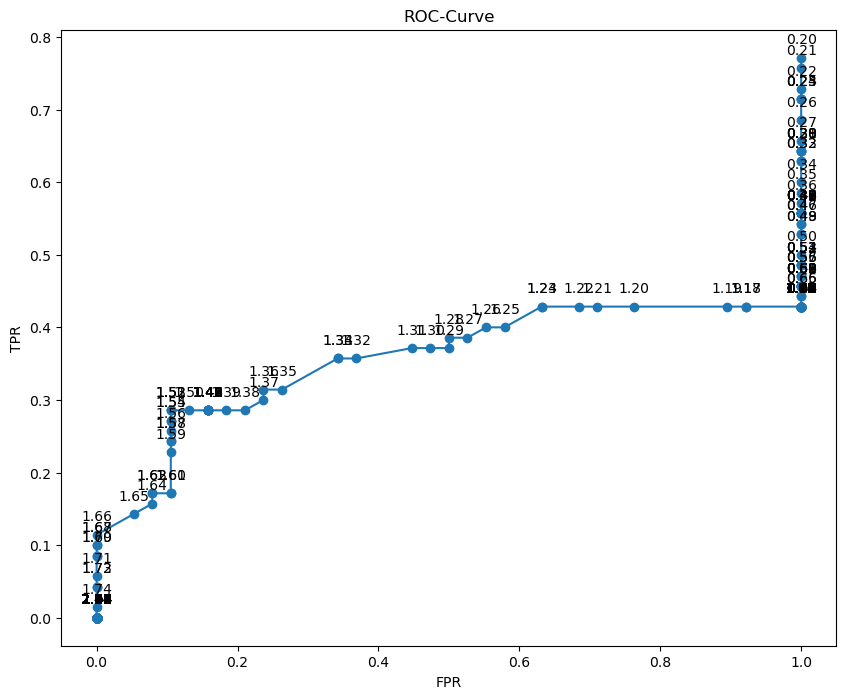

In [22]:
# Plot ROC Curves to decide threshold 
if SEQ:
    y_true = []
    with torch.no_grad():
        for i, label in validation_loader:
            y_true.append(label.item())
    
else:
    y_true = [0]*len(val_anomaly) + [1]*len(val_normal)

plot_ROC_curve(y_true)

### Evaluation
#### Calculate accuracy, precision, recall and F1-score.

Threshold = 8.270600318908691
True labels:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Predicted labels:  [1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


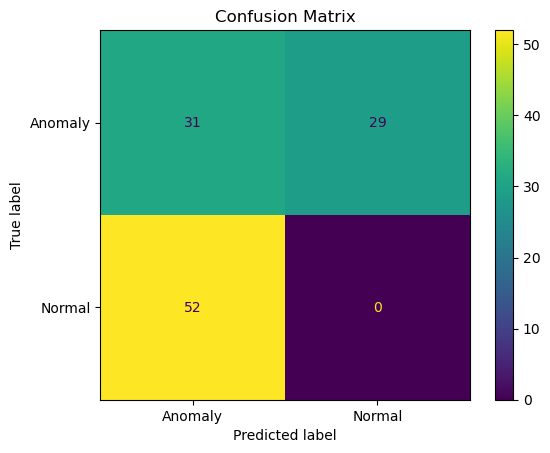

Accuracy 27.67857142857143%
Precision 37.34939759036144%
Recall 51.66666666666667%
F1-score 43.35664335664335%


In [49]:
threshold = final_validation_error*0.5 # By visualization
print(f"Threshold = {threshold}")

if SEQ:
    y_pred = predictSEQ(model, y_true, threshold, test_loader, criterion) 
    y_true = []
    with torch.no_grad():
        for _, label in test_loader:
            y_true.append(label.item())
else:
    y_pred = predict2D(model, threshold, test_normal, criterion, test_anomaly)
    y_true = [0]*len(test_anomaly) + [1]*len(test_normal)
    
print("True labels: ", y_true)
print("Predicted labels: ", y_pred)

# Generate and plot a confusion matrix
cm = generate_confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm)

# Calculate the performance metrics
metrics = calculate_metrics(cm)

## Visualize difference between images and locate anomalies
### Identify Anomalies!

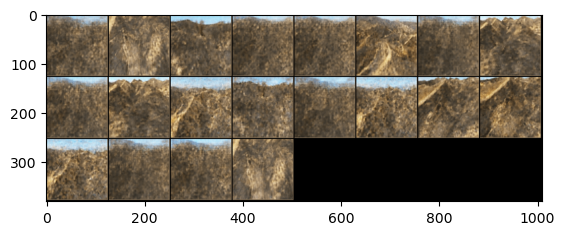

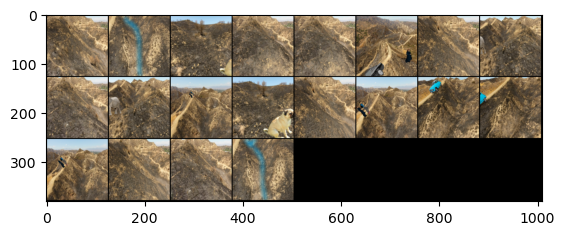

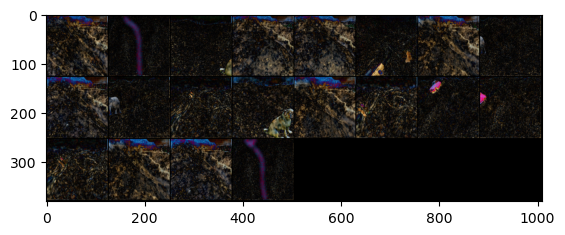

In [50]:
# Pick one batch to visualize
import cv2
with torch.no_grad():
    for batch_features in test_loader:
        batch_features = batch_features[0].to(device)
        images = np.squeeze(batch_features,axis=0) if SEQ else batch_features
        model.eval()
        reconstruction = model(images)        
        reconstruction = reconstruction.cpu()
        images = images.cpu()
        diff = torch.empty(images.shape)
        imshow(torchvision.utils.make_grid(reconstruction))
        imshow(torchvision.utils.make_grid(images))
        for i in range(len(images)):
            # Multiply with 1.2 to highlight differences
            diff[i] = abs(images[i]-reconstruction[i])*1.2 
        
        imshow(torchvision.utils.make_grid(diff))
  
        break